In [2]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def create_puzzle_bitmap(input_path, output_path):
    # Read image and convert to HSV color space (better for color detection)
    img = cv2.imread(input_path)
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    
    # Define range for white background in HSV
    lower_white = np.array([0, 0, 200], dtype=np.uint8)
    upper_white = np.array([255, 30, 255], dtype=np.uint8)
    
    # Create mask for white background
    background_mask = cv2.inRange(hsv, lower_white, upper_white)
    
    # Invert to get puzzle pieces (0=background, 1=pieces)
    puzzle_mask = cv2.bitwise_not(background_mask)
    bitmap = np.where(puzzle_mask == 255, 1, 0).astype(np.uint8)
    
    # Save and return results
    cv2.imwrite(output_path, bitmap * 255)
    return bitmap

"""# Usage example
bitmap = create_puzzle_bitmap('pieces1.png', 'puzzle_bitmap.png')

# Display results
plt.figure(figsize=(12, 6))
plt.subplot(121), plt.imshow(cv2.cvtColor(cv2.imread('pieces1.png'), cv2.COLOR_BGR2RGB))
plt.title('Original Image'), plt.axis('off')
plt.subplot(122), plt.imshow(bitmap, cmap='gray')
plt.title('Puzzle Piece Mask'), plt.axis('off')
plt.show()"""

"# Usage example\nbitmap = create_puzzle_bitmap('pieces1.png', 'puzzle_bitmap.png')\n\n# Display results\nplt.figure(figsize=(12, 6))\nplt.subplot(121), plt.imshow(cv2.cvtColor(cv2.imread('pieces1.png'), cv2.COLOR_BGR2RGB))\nplt.title('Original Image'), plt.axis('off')\nplt.subplot(122), plt.imshow(bitmap, cmap='gray')\nplt.title('Puzzle Piece Mask'), plt.axis('off')\nplt.show()"

# Watershed

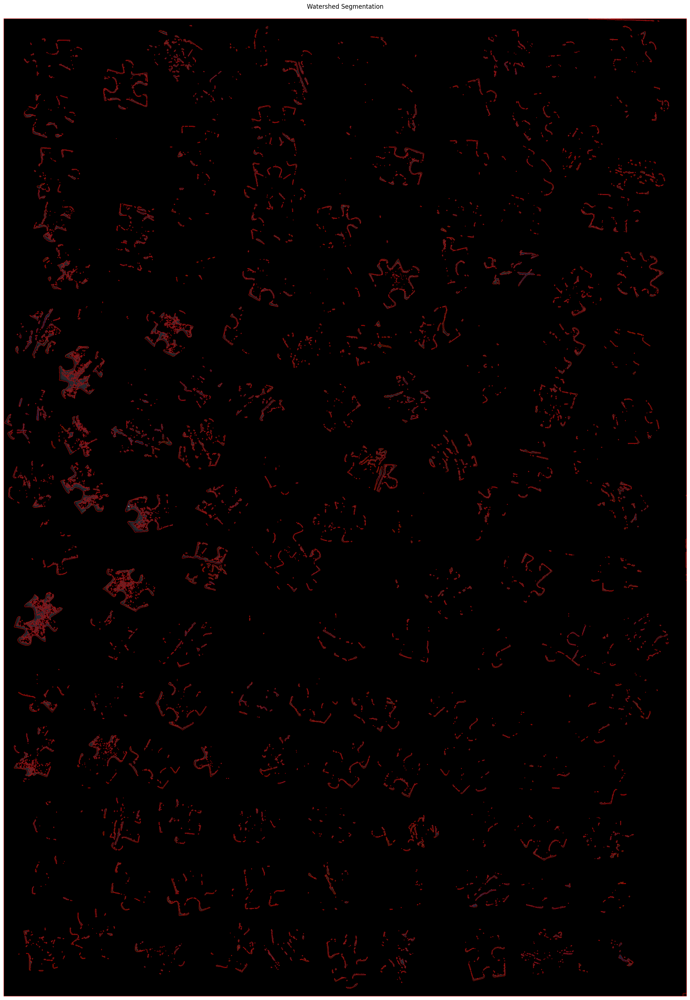

In [ ]:
import numpy as np
img = cv2.imread("pieces1.png")
#img = img[900:1300, 300:900]
imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_, imgTreshhold = cv2.threshold(img, 40, 255, cv2.THRESH_BINARY_INV)

# Add edge sharpening
kernel_sharpen = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
sharpened = cv2.filter2D(imgTreshhold, -1, kernel_sharpen)

# More precise morphological operations
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
imgDilation = cv2.morphologyEx(sharpened, cv2.MORPH_DILATE, kernel, iterations=1)
distTrans = cv2.distanceTransform(imgDilation, cv2.DIST_L2, 5)
_,distThresh = cv2.threshold(distTrans,15, 255, 0)
distTrans = np.uint8(distTrans)
_,labels = cv2.connectedComponents(distTrans)



labels = np.int32(labels)
labels = cv2.watershed(imgRGB, labels)
imgRGB[labels == -1] = [255,0,0]
dpi = 100
height, width = imgRGB.shape[:2]
figsize = (width / float(dpi), height / float(dpi))

plt.figure(figsize=figsize, dpi=dpi)
plt.imshow(imgRGB)
plt.title('Watershed Segmentation', pad=20)
plt.axis('off')
plt.show()

# Cany

In [4]:
img.shape

(3497, 2445)

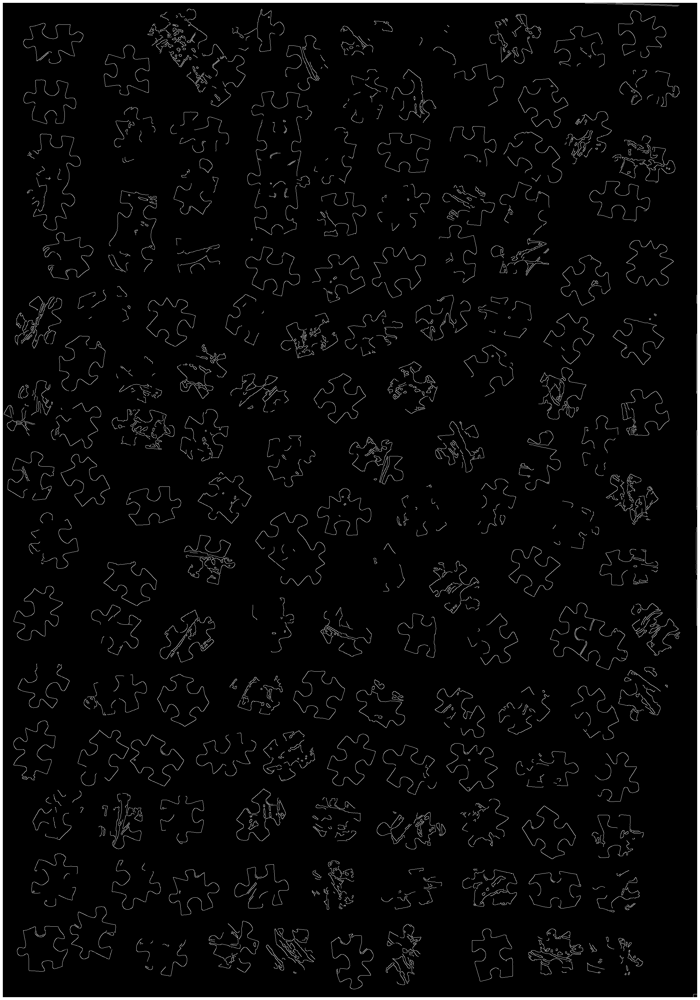

In [38]:
#canny = cv2.Canny(img,180, 200)
blur = cv2.GaussianBlur(img,(5,5),0)
canny = cv2.Canny(blur,100, 200)
dpi = 100
height, width = canny.shape[:2]
figsize = width / float(dpi), height / float(dpi)

fig = plt.figure(figsize=figsize, dpi=dpi)
ax = fig.add_axes([0, 0, 1, 1])
ax.imshow(canny, cmap='gray')
ax.axis('off')
plt.show()

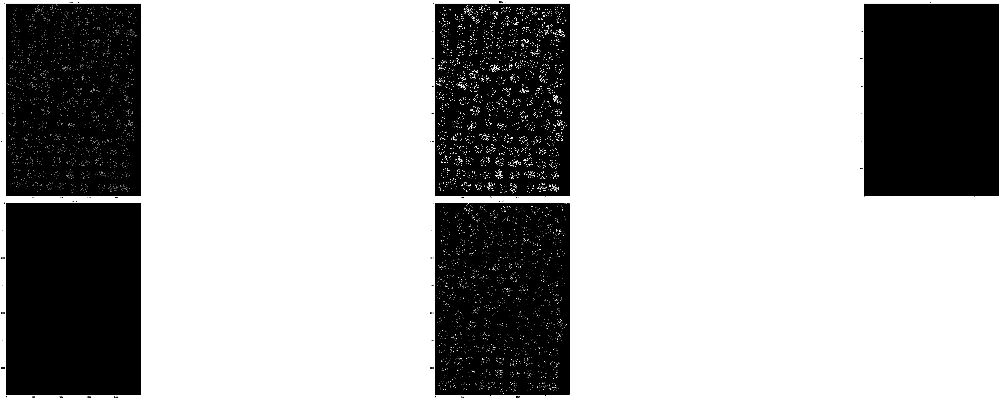

In [20]:
# After Canny edge detection
kernel = np.ones((3,3), np.uint8)  # Structuring element

# 1. Dilation (expands edges)
dilated = cv2.dilate(canny, kernel, iterations=1)

# 2. Erosion (shrinks edges)
eroded = cv2.erode(canny, kernel, iterations=1)

# 3. Opening (erosion then dilation - removes noise)
opened = cv2.morphologyEx(canny, cv2.MORPH_OPEN, kernel)

# 4. Closing (dilation then erosion - fills small holes)
closed = cv2.morphologyEx(canny, cv2.MORPH_CLOSE, kernel)

# Display results
dpi = 100
height, width = canny.shape[:2]
figsize = (width * 5 / float(dpi), height / float(dpi))  # Adjusted for 5 subplots

plt.figure(figsize=figsize, dpi=dpi)
plt.subplot(231), plt.imshow(canny, cmap='gray'), plt.title('Original Edges')
plt.subplot(232), plt.imshow(dilated, cmap='gray'), plt.title('Dilated')
plt.subplot(233), plt.imshow(eroded, cmap='gray'), plt.title('Eroded')
plt.subplot(234), plt.imshow(opened, cmap='gray'), plt.title('Opening')
plt.subplot(235), plt.imshow(closed, cmap='gray'), plt.title('Closing')
plt.tight_layout()  # Add this to prevent label overlap
plt.show()

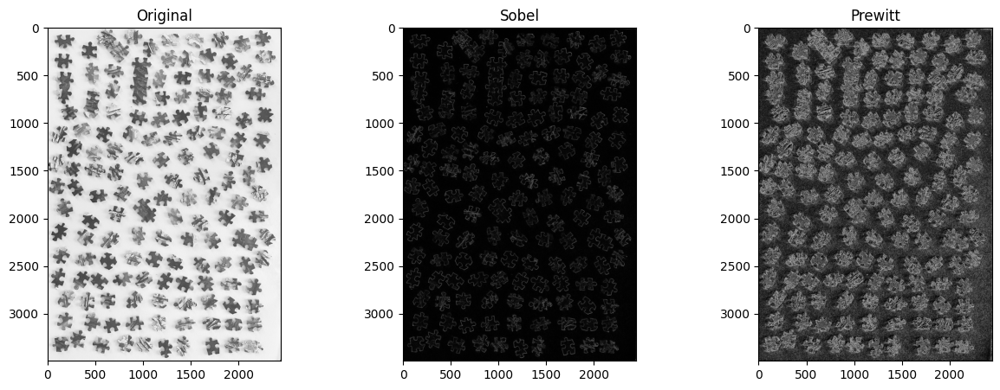

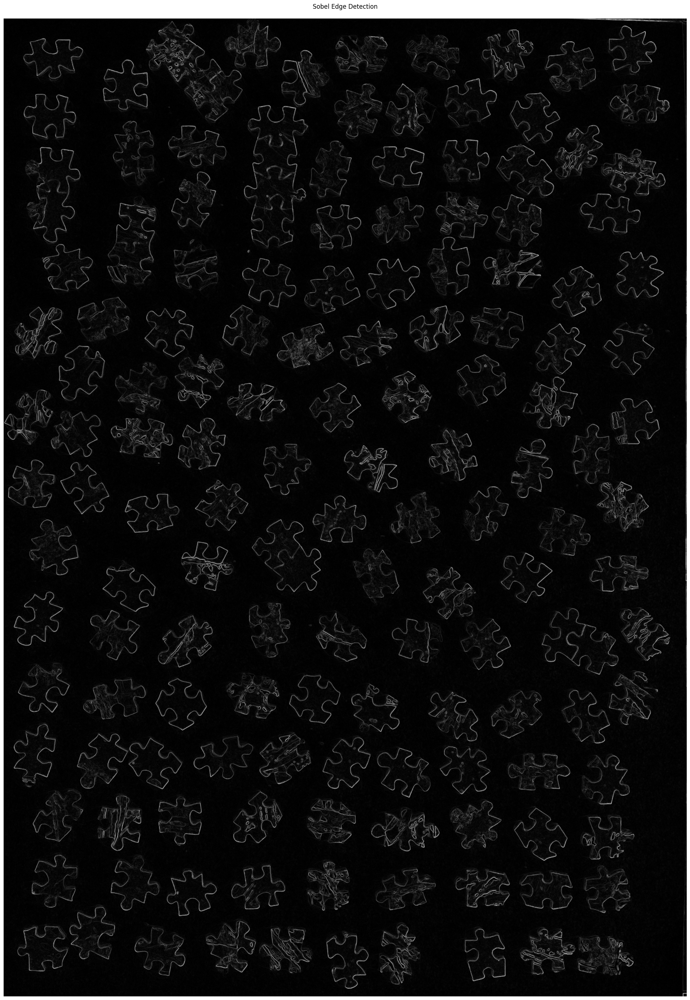

In [22]:
# Load image and convert to grayscale
img = cv2.imread('pieces1.png', cv2.IMREAD_GRAYSCALE)

# Sobel Edge Detection
sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)
sobel = np.sqrt(sobel_x**2 + sobel_y**2)
sobel = np.uint8(255 * sobel / np.max(sobel))

# Prewitt Edge Detection
kernel_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
kernel_y = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])
prewitt_x = cv2.filter2D(img, -1, kernel_x)
prewitt_y = cv2.filter2D(img, -1, kernel_y)
prewitt = np.sqrt(prewitt_x**2 + prewitt_y**2)
prewitt = np.uint8(255 * prewitt / np.max(prewitt))

# Display results
plt.figure(figsize=(15, 5))
plt.subplot(131), plt.imshow(img, cmap='gray'), plt.title('Original')
plt.subplot(132), plt.imshow(sobel, cmap='gray'), plt.title('Sobel')
plt.subplot(133), plt.imshow(prewitt, cmap='gray'), plt.title('Prewitt')
plt.show()
dpi = 100
height, width = sobel.shape[:2]
figsize = (width / float(dpi), height / float(dpi))

plt.figure(figsize=figsize, dpi=dpi)
plt.imshow(sobel, cmap='gray')
plt.title('Sobel Edge Detection', pad=20)
plt.axis('off')
plt.show()